# prelim death model results

note, with convoltuion bug (afaik). 

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
### Initial imports
import logging
import numpy as np
import pandas as pd
import pymc3 as pm
import theano.tensor as T
import matplotlib.pyplot as plt

logging.basicConfig(level=logging.INFO)
log = logging.getLogger(__name__)

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

from epimodel.pymc3_models.utils import geom_convolution
from epimodel.pymc3_models import cm_effect
from epimodel.pymc3_models.cm_effect.datapreprocessor import DataPreprocessor


%matplotlib inline

INFO:epimodel.regions:Name index has 7 potential conflicts: ['american samoa', 'georgia', 'guam', 'northern mariana islands', 'puerto rico', 'united states minor outlying islands', 'virgin islands (u.s.)']
INFO:epimodel.pymc3_models.cm_effect.datapreprocessor:
Countermeasures                               min   ... mean  ... max   ... unique
 1 Mask wearing over 70%                      0.000 ... 0.081 ... 1.000 ... [0. 1.]
 2 Gatherings limited to 10                   0.000 ... 0.126 ... 1.000 ... [0. 1.]
 3 Gatherings limited to 100                  0.000 ... 0.230 ... 1.000 ... [0. 1.]
 4 Gatherings limited to 1000                 0.000 ... 0.257 ... 1.000 ... [0. 1.]
 5 Business suspended - some                  0.000 ... 0.065 ... 1.000 ... [0. 1.]
 6 Business suspended - many                  0.000 ... 0.179 ... 1.000 ... [0. 1.]
 7 Schools and universities closed            0.000 ... 0.336 ... 1.000 ... [0. 1.]
 8 General curfew                             0.000 ... 0.129 ... 1.

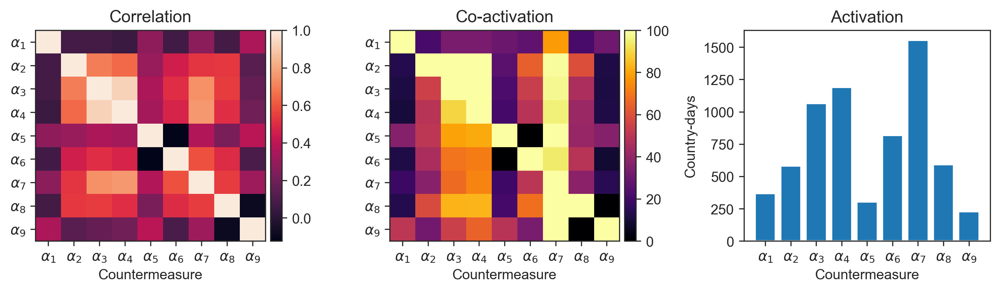

In [141]:
regions = ['AT', 'BA', 'BE', 'BG', 'CH', 'CZ', 'DE', 'DK', 'EE', 'ES', 'FI', 'FR', 'GB', 'GR', 'HR', 'HU', 'IE', 'IS', 'IT', 'LT', 'NL', 'PL', 'RO', 'RS', 'RU', 'SE', 'SI', 'SK']
# Same, outside Europe
regions += ['AD', 'CN-HK', 'EG', 'IL', 'JP', 'KR', 'MX', 'SG', 'MY', 'MA', 'ZA', 'TW']


features = [
 'Mask wearing over 70%',
 'Gatherings limited to 10',
 'Gatherings limited to 100',
 'Gatherings limited to 1000',
 'Business suspended - some',
 'Business suspended - many',
 'Schools and universities closed',
 'General curfew',
 'Healthcare specialisation']

dp = DataPreprocessor(end_date="2020-04-21")
data = dp.preprocess_data("../../data", regions, features, selected_cm_set="countermeasures-model-boolean_Gat3Bus2SchCurHespMa.csv")

# fatility model

use the ICL fatility model. 

In [7]:
import scipy.stats as stats
imo

In [1]:
nRVs= 10000000
samples = np.random.gamma(shape=1.352, scale=3.77, size=nRVs) + np.random.negative_binomial(n=1.57, p = (1-0.7698), size=nRVs)
bins = np.arange(65.0)
bins[1:] += 0.5

NameError: name 'np' is not defined

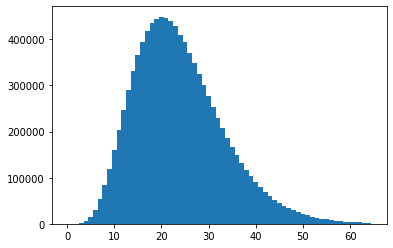

In [75]:
n, _, _ = plt.hist(samples, bins);

In [81]:
delay_prob = n / np.sum(n)
print(f"Expectation: {np.sum([(i+1) * delay_prob[i] for i in range(64)])}")
print(f"True Mean: {np.mean(samples)}")

Expectation: 23.856398706224134
True Mean: 23.900917997419327


In [84]:
delay_prob

array([2.10204045e-06, 3.22312869e-05, 1.84979560e-04, 6.31412913e-04,
       1.53949439e-03, 3.07378372e-03, 5.32847235e-03, 8.32057678e-03,
       1.19864352e-02, 1.59626950e-02, 2.02752812e-02, 2.47013776e-02,
       2.90892369e-02, 3.30827134e-02, 3.66035310e-02, 3.95327745e-02,
       4.19039762e-02, 4.35677913e-02, 4.45407357e-02, 4.49607434e-02,
       4.47581467e-02, 4.40800885e-02, 4.28367817e-02, 4.10649618e-02,
       3.93901360e-02, 3.71499615e-02, 3.48922699e-02, 3.24149652e-02,
       3.00269472e-02, 2.76836725e-02, 2.52794388e-02, 2.29349630e-02,
       2.07959867e-02, 1.86809336e-02, 1.67279378e-02, 1.50166767e-02,
       1.33057159e-02, 1.17490048e-02, 1.03030011e-02, 9.10633952e-03,
       7.97333972e-03, 6.95565185e-03, 6.05717970e-03, 5.25950540e-03,
       4.61137626e-03, 3.94442886e-03, 3.37948046e-03, 2.91402865e-03,
       2.48911619e-03, 2.14007737e-03, 1.81005702e-03, 1.54339818e-03,
       1.32068199e-03, 1.11358095e-03, 9.53425490e-04, 7.99876440e-04,
      

In [86]:
padded_delay_prob = np.array([0, 
       2.10204045e-06, 3.22312869e-05, 1.84979560e-04, 6.31412913e-04,
       1.53949439e-03, 3.07378372e-03, 5.32847235e-03, 8.32057678e-03,
       1.19864352e-02, 1.59626950e-02, 2.02752812e-02, 2.47013776e-02,
       2.90892369e-02, 3.30827134e-02, 3.66035310e-02, 3.95327745e-02,
       4.19039762e-02, 4.35677913e-02, 4.45407357e-02, 4.49607434e-02,
       4.47581467e-02, 4.40800885e-02, 4.28367817e-02, 4.10649618e-02,
       3.93901360e-02, 3.71499615e-02, 3.48922699e-02, 3.24149652e-02,
       3.00269472e-02, 2.76836725e-02, 2.52794388e-02, 2.29349630e-02,
       2.07959867e-02, 1.86809336e-02, 1.67279378e-02, 1.50166767e-02,
       1.33057159e-02, 1.17490048e-02, 1.03030011e-02, 9.10633952e-03,
       7.97333972e-03, 6.95565185e-03, 6.05717970e-03, 5.25950540e-03,
       4.61137626e-03, 3.94442886e-03, 3.37948046e-03, 2.91402865e-03,
       2.48911619e-03, 2.14007737e-03, 1.81005702e-03, 1.54339818e-03,
       1.32068199e-03, 1.11358095e-03, 9.53425490e-04, 7.99876440e-04,
       6.76156345e-04, 5.68752088e-04, 4.93278826e-04, 4.08596625e-04,
       3.37127249e-04, 2.92283720e-04, 2.41934846e-04, 1.98392580e-04])

In [92]:
with cm_effect.models.CMModelFlexibleV3p3(data) as model:
    model.build_cm_reduction_exp_gamma_prior()
    model.build_region_growth_prior()
    model.build_region_reliability_prior(pm.Normal, {"mu": 1, "sigma": 0.00005})
    model.build_rates()
    model.build_output_model()

/Users/mrinank/Library/Caches/pypoetry/virtualenvs/epimodel-H-ywULmv-py3.7/lib/python3.7/site-packages/pymc3/model.py:1430: ImputationWarning: Data in Observed_log contains missing values and will be automatically imputed from the sampling distribution.
  warnings.warn(impute_message, ImputationWarning)


In [89]:
model.run(2000)

Auto-assigning NUTS sampler...
INFO:pymc3:Auto-assigning NUTS sampler...
Initializing NUTS using adapt_diag...
INFO:pymc3:Initializing NUTS using adapt_diag...


CM_Alpha_log__              -15.61
RegionGrowthRate_log          9.98
RegionNoiseScale            314.46
Growth                      658.43
InitialSize_log            -112.75
Observed_log_missing          0.00
Observed_log           -1631525.36
Name: Log-probability of test_point, dtype: float64


Multiprocess sampling (2 chains in 2 jobs)
INFO:pymc3:Multiprocess sampling (2 chains in 2 jobs)
NUTS: [Observed_log_missing, InitialSize_log, Growth, RegionNoiseScale, RegionGrowthRate_log, CM_Alpha]
INFO:pymc3:NUTS: [Observed_log_missing, InitialSize_log, Growth, RegionNoiseScale, RegionGrowthRate_log, CM_Alpha]
Sampling 2 chains, 0 divergences: 100%|██████████| 5000/5000 [1:11:17<00:00,  1.17draws/s]
The rhat statistic is larger than 1.2 for some parameters.
The estimated number of effective samples is smaller than 200 for some parameters.
ERROR:pymc3:The estimated number of effective samples is smaller than 200 for some parameters.


INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/heldout_validation/out


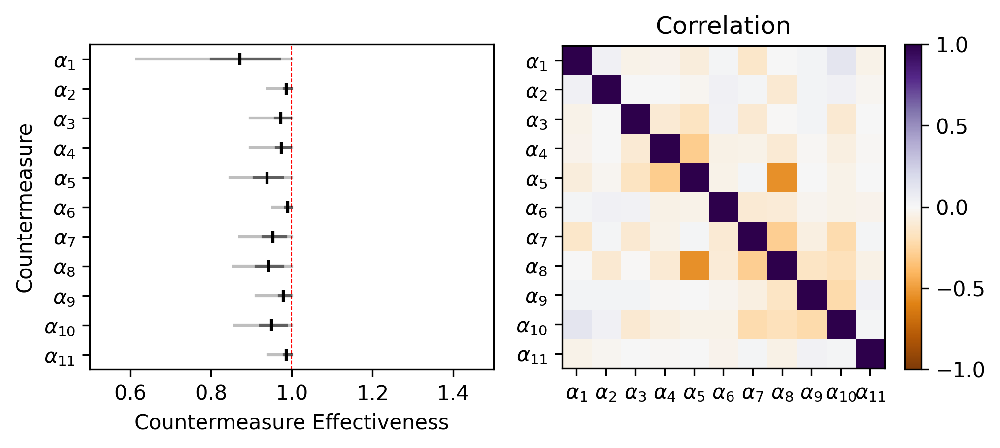

In [90]:
model.plot_effect()

INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/heldout_validation/out
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/heldout_validation/out
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/heldout_validation/out
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/heldout_validation/out
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/heldout_validation/out
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/heldout_validation/out
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/h

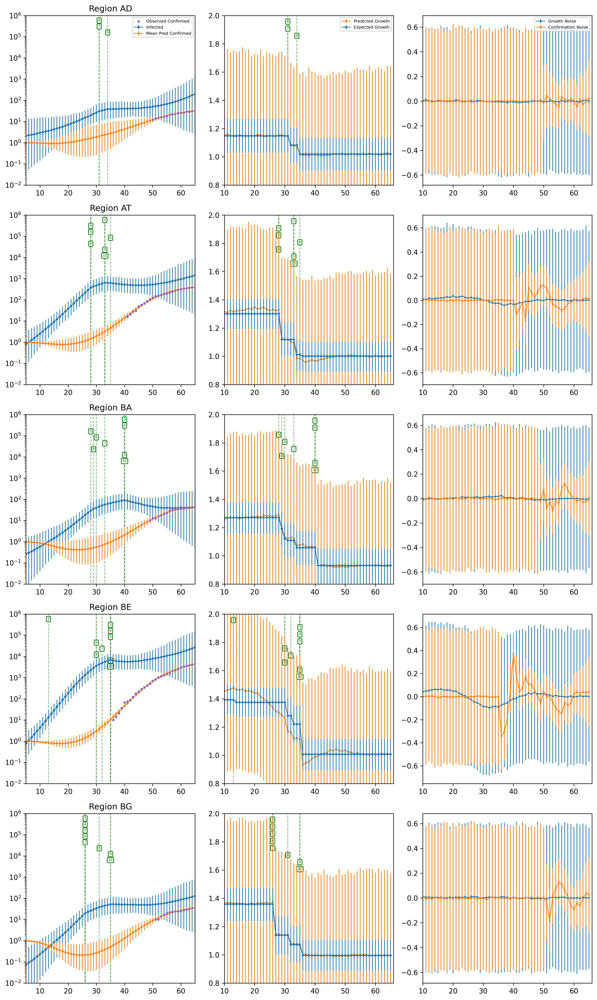

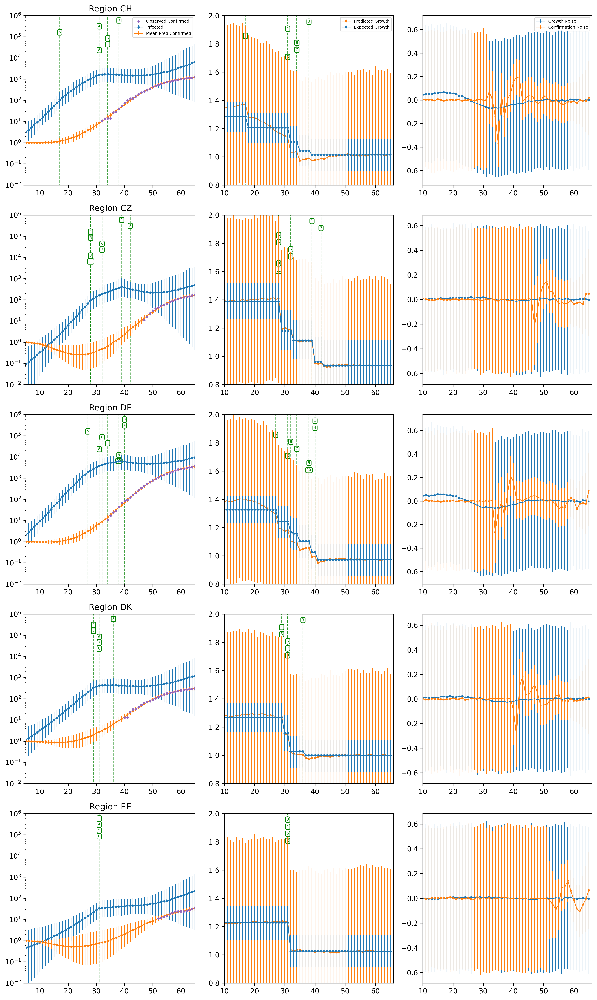

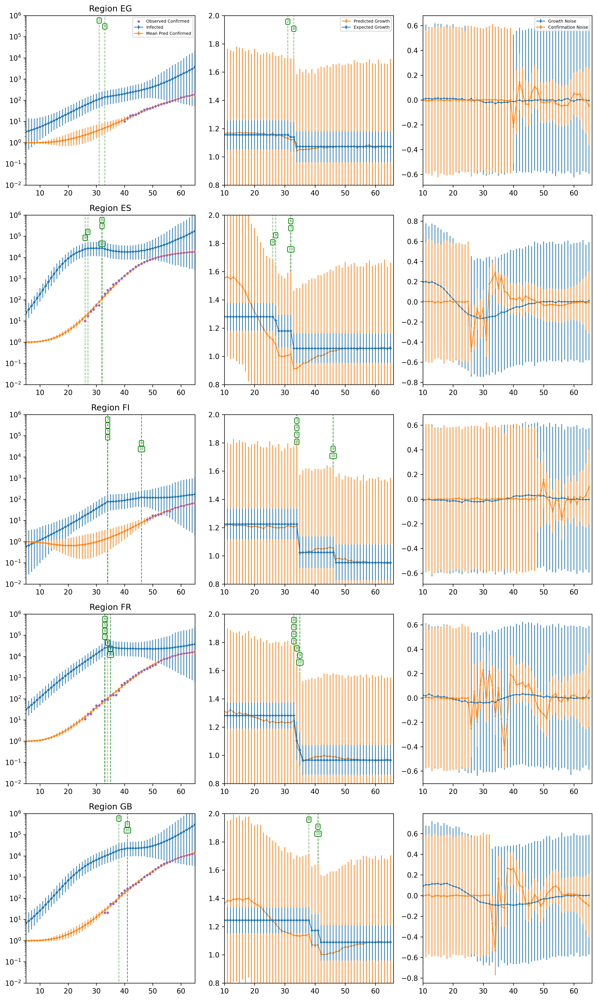

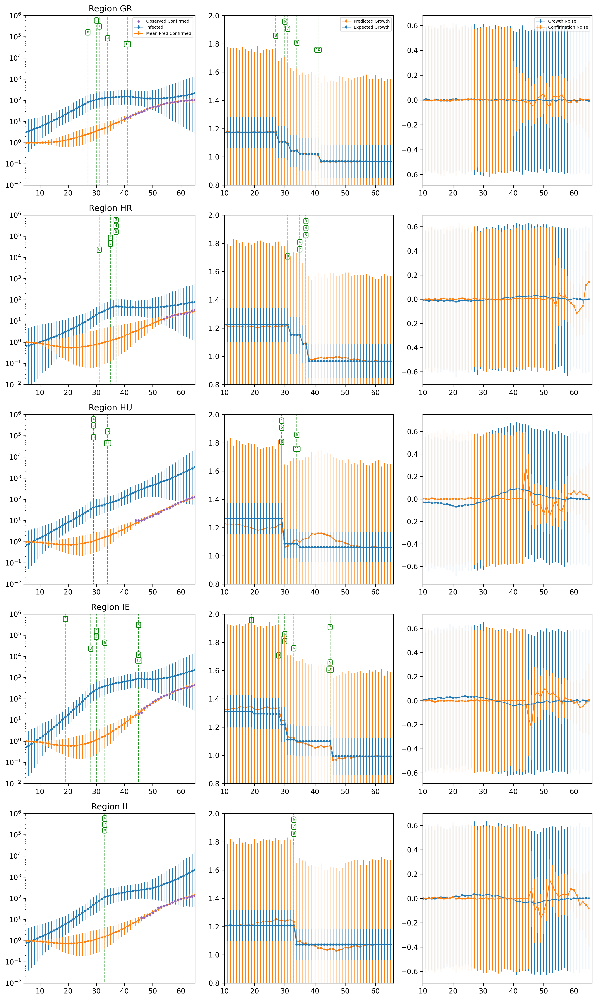

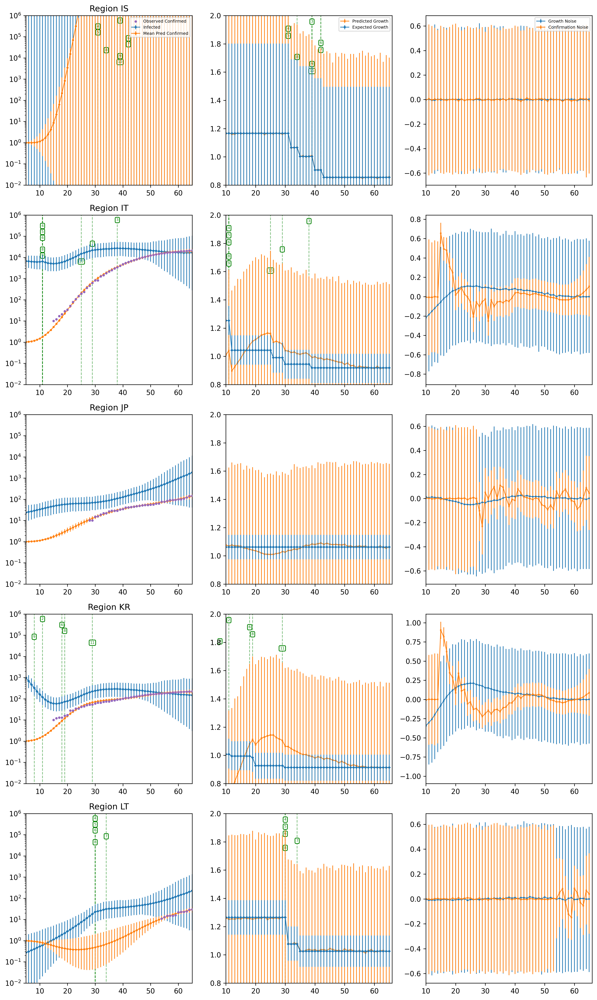

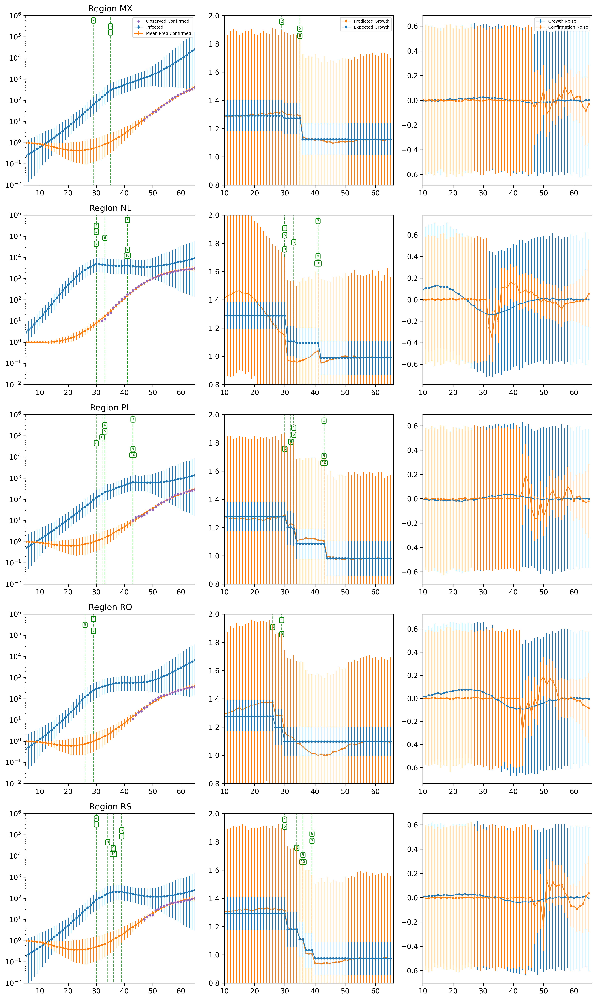

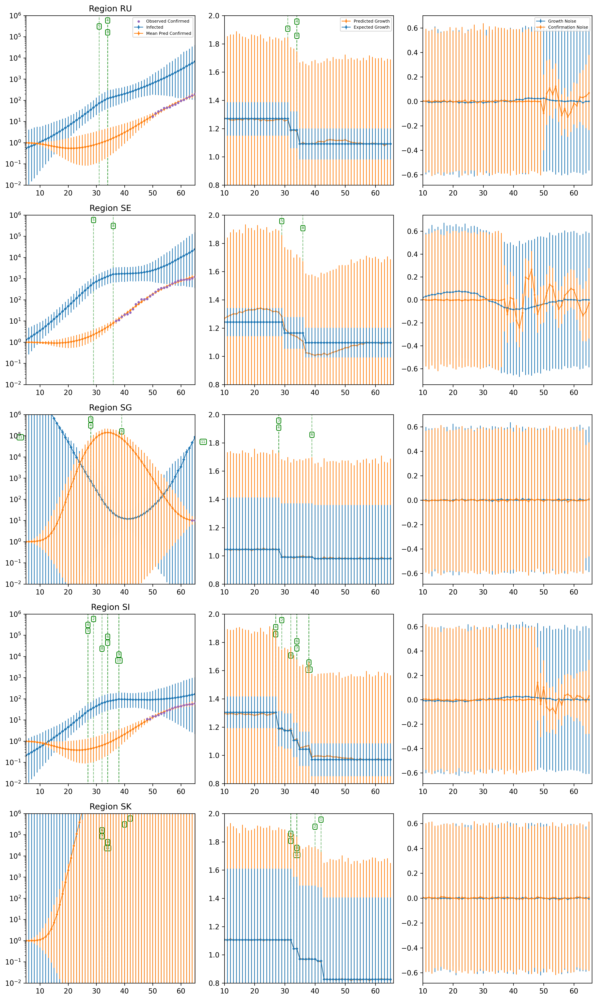

In [91]:
model.plot_region_predictions()

INFO:epimodel.regions:Name index has 7 potential conflicts: ['american samoa', 'georgia', 'guam', 'northern mariana islands', 'puerto rico', 'united states minor outlying islands', 'virgin islands (u.s.)']
INFO:epimodel.pymc3_models.cm_effect.datapreprocessor:
Countermeasures                               min   ... mean  ... max   ... unique
 1 Masks over 60                              0.000 ... 0.009 ... 1.000 ... [0. 1.]
 2 Gatherings limited to 10                   0.000 ... 0.146 ... 1.000 ... [0. 1.]
 3 Gatherings limited to 100                  0.000 ... 0.248 ... 1.000 ... [0. 1.]
 4 Gatherings limited to 1000                 0.000 ... 0.280 ... 1.000 ... [0. 1.]
 5 Business suspended - some                  0.000 ... 0.281 ... 1.000 ... [0. 1.]
 6 Business suspended - many                  0.000 ... 0.206 ... 1.000 ... [0. 1.]
 7 Schools and universities closed            0.000 ... 0.352 ... 1.000 ... [0. 1.]
 8 General curfew - strict                    0.000 ... 0.154 ... 1.

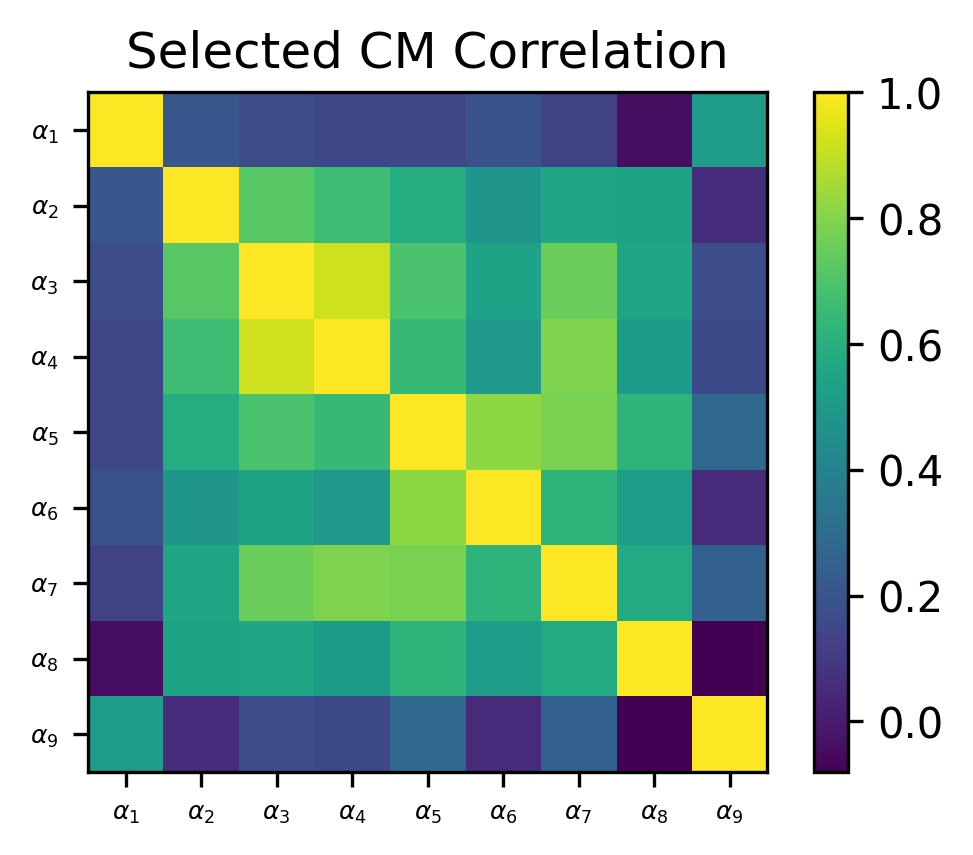

INFO:epimodel.pymc3_models.cm_effect.datapreprocessor:Data Preprocessing Complete using:

{
    "start_date": "2020-2-10",
    "end_date": "2020-04-15",
    "min_final_num_active_cases": 100,
    "min_num_active_mask": 10,
    "min_num_confirmed_mask": 10
}
Selected 32 Regions: f['AD', 'AT', 'BA', 'BE', 'BG', 'CH', 'CZ', 'DE', 'DK', 'EE', 'EG', 'ES', 'FI', 'FR', 'GB', 'GR', 'HR', 'HU', 'IE', 'IL', 'IT', 'JP', 'KR', 'LT', 'MX', 'NL', 'PL', 'RO', 'RS', 'RU', 'SE', 'SI']


In [93]:
regions = ['AT', 'BA', 'BE', 'BG', 'CH', 'CZ', 'DE', 'DK', 'EE', 'ES', 'FI', 'FR', 'GB', 'GR', 'HR', 'HU', 'IE', 'IT', 'LT', 'NL', 'PL', 'RO', 'RS', 'RU', 'SE', 'SI']
# Same, outside Europe
regions += ['AD', 'CN-HK', 'EG', 'IL', 'JP', 'KR', 'MX']


features = ['Masks over 60',
 'Gatherings limited to 10',
 'Gatherings limited to 100',
 'Gatherings limited to 1000',
 'Business suspended - some',
 'Business suspended - many',
 'Schools and universities closed',
 'General curfew - strict',
 'Healthcare specialisation over 0.2']

dp = DataPreprocessor(end_date="2020-04-15")
data = dp.preprocess_data("../../data", regions, features)

In [110]:
with cm_effect.models.CMModelFlexibleV3p3(data) as model:
    model.build_cm_reduction_exp_gamma_prior()
    model.build_region_growth_prior()
    model.build_region_reliability_prior(pm.Normal, {"mu": 1, "sigma": 0.05})
    model.build_rates()
    model.build_output_model()

/Users/mrinank/Library/Caches/pypoetry/virtualenvs/epimodel-H-ywULmv-py3.7/lib/python3.7/site-packages/pymc3/model.py:1430: ImputationWarning: Data in Observed contains missing values and will be automatically imputed from the sampling distribution.
  warnings.warn(impute_message, ImputationWarning)


In [111]:
model.run(2000, cores=8)

Auto-assigning NUTS sampler...
INFO:pymc3:Auto-assigning NUTS sampler...
Initializing NUTS using adapt_diag...
INFO:pymc3:Initializing NUTS using adapt_diag...


CM_Alpha_log__             -12.77
RegionGrowthRate_log         9.12
RegionNoiseScale            66.46
Growth                     601.99
InitialSize_log           -103.09
Observed_missing             0.00
Observed               -430933.42
Name: Log-probability of test_point, dtype: float64


Multiprocess sampling (2 chains in 8 jobs)
INFO:pymc3:Multiprocess sampling (2 chains in 8 jobs)
NUTS: [Observed_missing, InitialSize_log, Growth, RegionNoiseScale, RegionGrowthRate_log, CM_Alpha]
INFO:pymc3:NUTS: [Observed_missing, InitialSize_log, Growth, RegionNoiseScale, RegionGrowthRate_log, CM_Alpha]
Sampling 2 chains, 3,431 divergences: 100%|██████████| 5000/5000 [41:19<00:00,  2.02draws/s]
There were 1725 divergences after tuning. Increase `target_accept` or reparameterize.
ERROR:pymc3:There were 1725 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.39013474731782016, but should be close to 0.8. Try to increase the number of tuning steps.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
There were 1705 divergences after tuning. Increase `target_accept` or reparameterize.
ERROR:pymc3:There were 1705 divergences after tuning. Increase `targ

INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/heldout_validation/out
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/heldout_validation/out
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/heldout_validation/out
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/heldout_validation/out
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/heldout_validation/out
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/heldout_validation/out
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/h

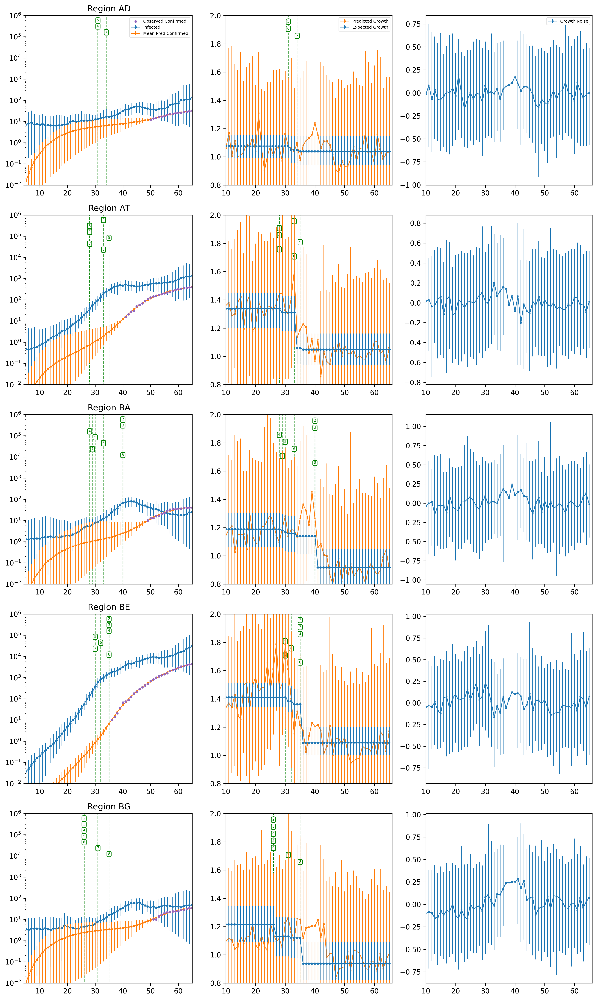

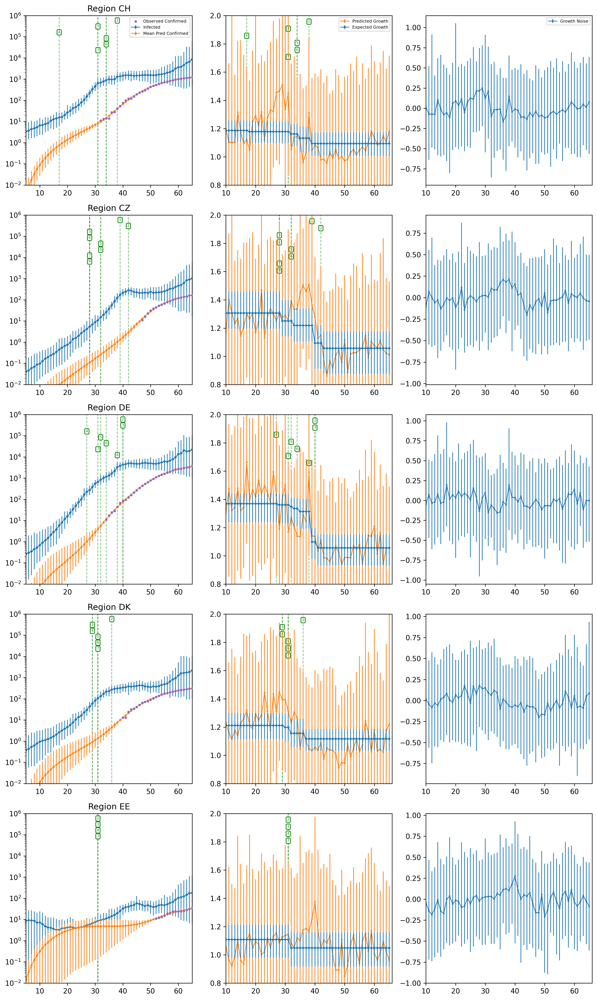

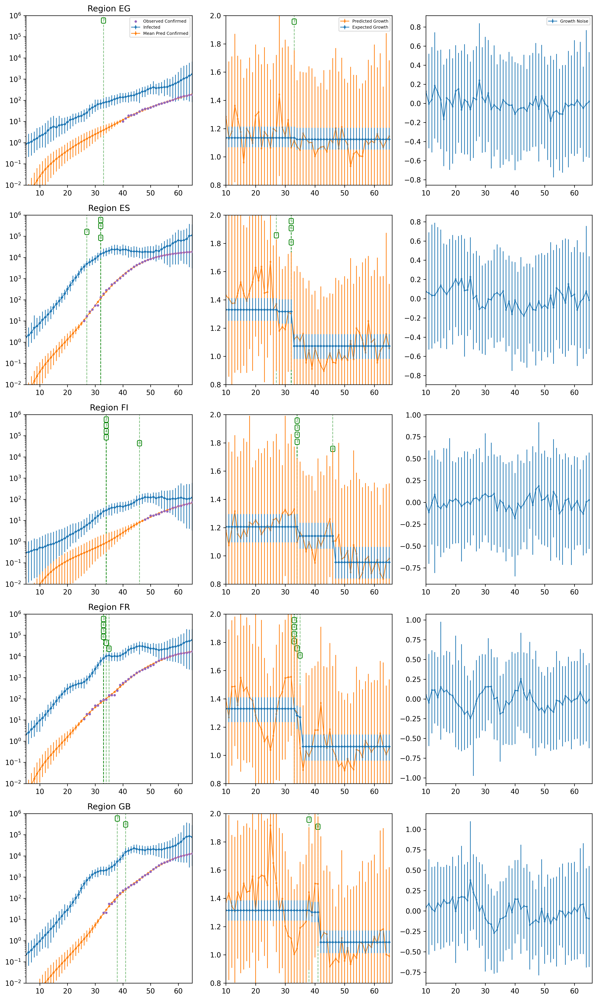

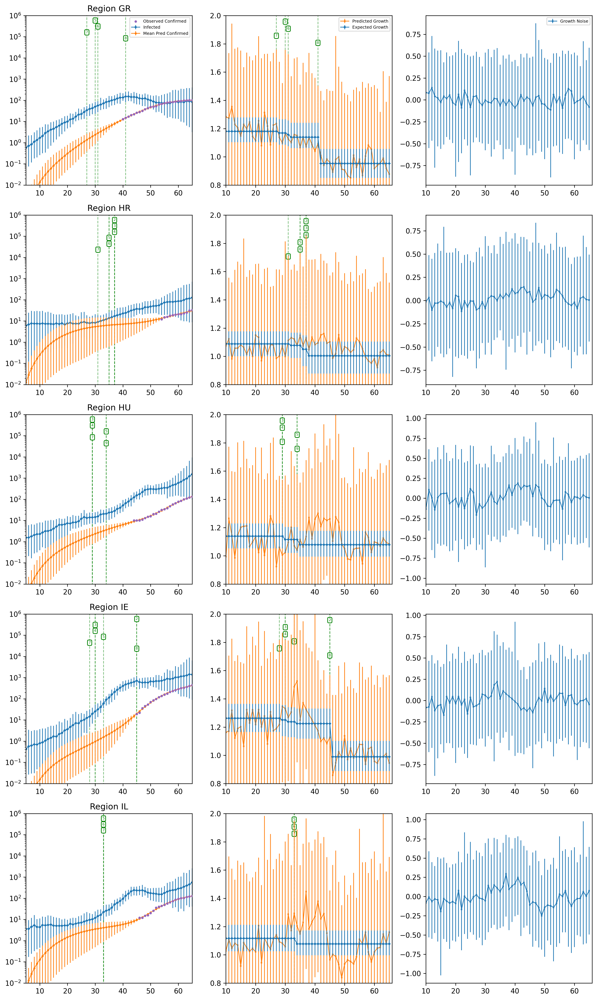

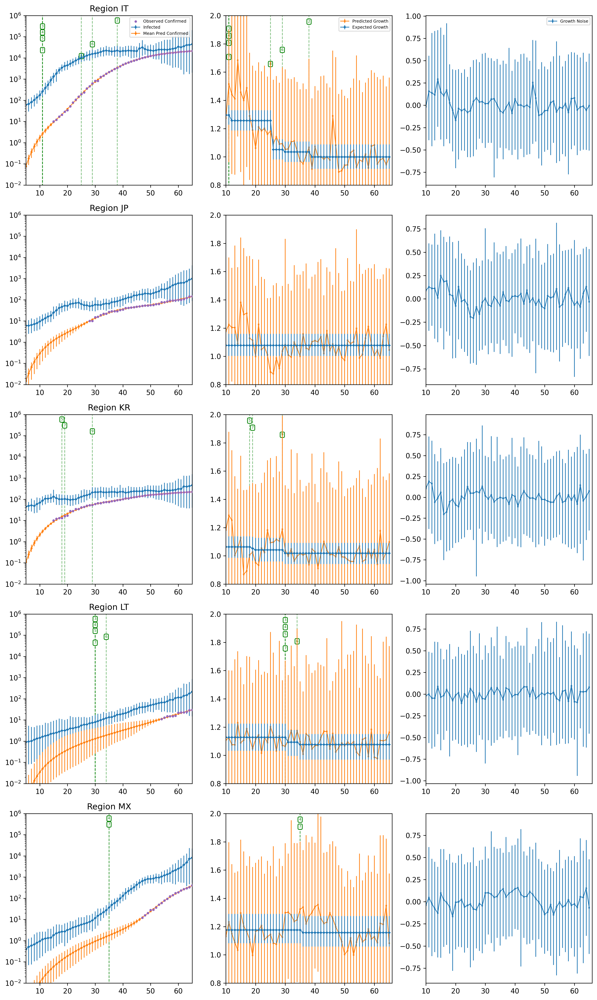

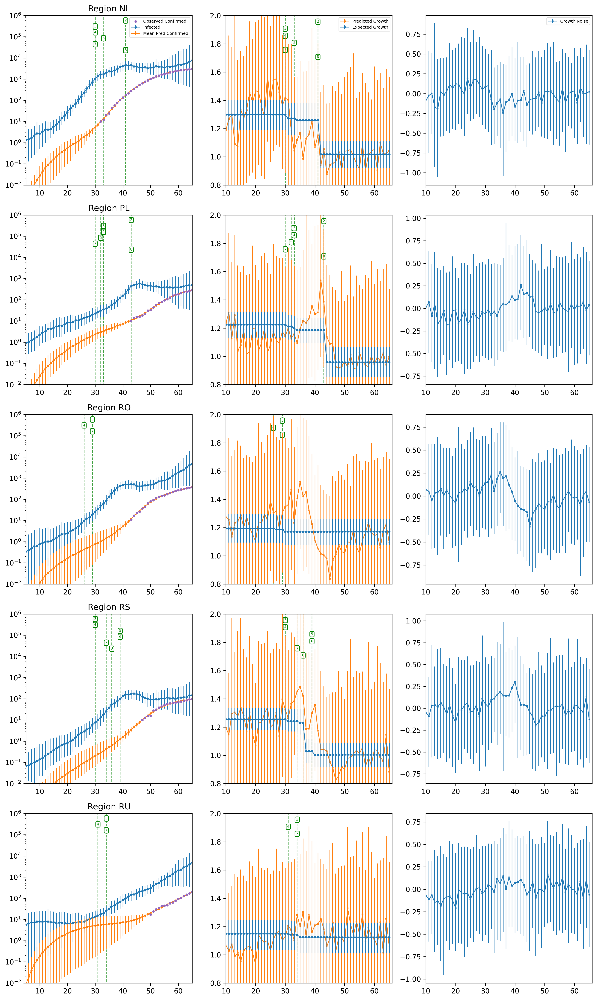

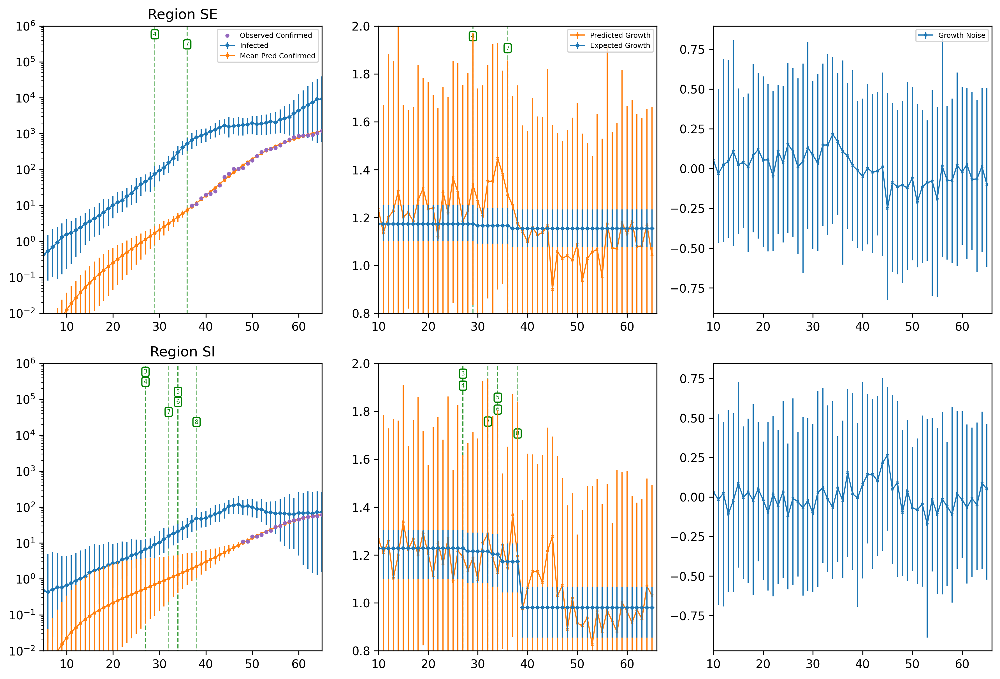

In [113]:
model.plot_region_predictions()

INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/heldout_validation/out


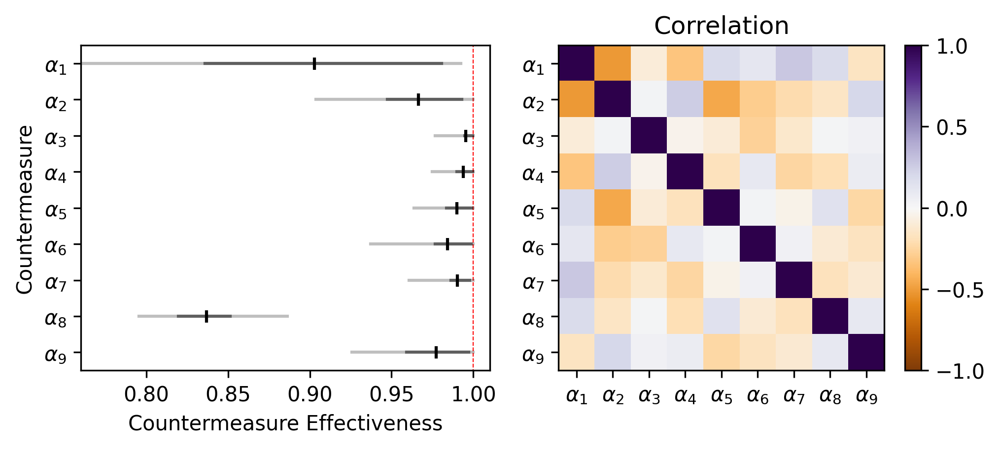

In [117]:
model.plot_effect(x_min=0.76, x_max = 1.01)

In [140]:
model.trace

<MultiTrace: 2 chains, 2000 iterations, 15 variables>

INFO:epimodel.regions:Name index has 7 potential conflicts: ['american samoa', 'georgia', 'guam', 'northern mariana islands', 'puerto rico', 'united states minor outlying islands', 'virgin islands (u.s.)']
INFO:epimodel.pymc3_models.cm_effect.datapreprocessor:
Countermeasures                               min   ... mean  ... max   ... unique
 1 Gatherings limited to 10                   0.000 ... 0.106 ... 1.000 ... [0. 1.]
 2 Business suspended - some                  0.000 ... 0.031 ... 1.000 ... [0. 1.]
 3 Schools and universities closed            0.000 ... 0.347 ... 1.000 ... [0. 1.]
 4 General curfew                             0.000 ... 0.239 ... 1.000 ... [0. 1.]
INFO:epimodel.pymc3_models.cm_effect.datapreprocessor:Data Preprocessing Complete using:

{
    "start_date": "2020-2-10",
    "end_date": "2020-04-21",
    "min_final_num_active_cases": 100,
    "min_num_active_mask": 10,
    "min_num_confirmed_mask": 10
}
Selected 5 Regions: f['DE', 'FR', 'GB', 'IT', 'RO']


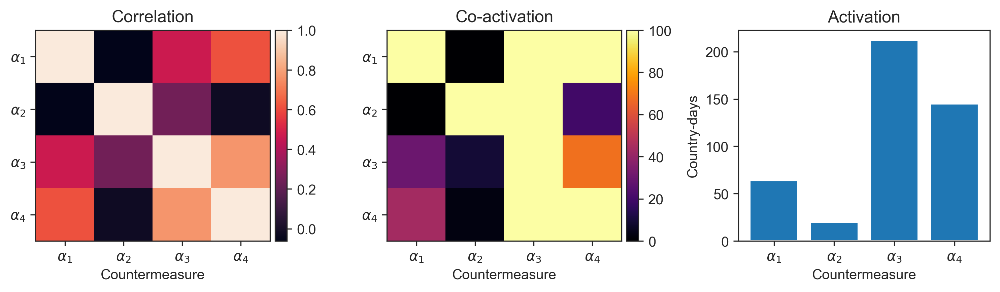

In [153]:
regions = ['DE', 'FR', 'GB', 'IT', 'RO']


features = [
 'Gatherings limited to 10',
 'Business suspended - some',
 'Schools and universities closed',
 'General curfew']

dp = DataPreprocessor(end_date="2020-04-21")
data = dp.preprocess_data("../../data", regions, features, selected_cm_set="countermeasures-model-boolean_Gat3Bus2SchCurHespMa.csv")

In [164]:
with cm_effect.models.CMModelFlexibleV3p3(data) as model:
    model.build_cm_reduction_exp_gamma_prior()
    model.build_region_growth_prior()
    model.build_region_reliability_prior(pm.Normal, {"mu": 1, "sigma": 0.05})
    model.build_rates()
    model.build_output_model()

In [166]:
model.run(2000, cores=8)

Auto-assigning NUTS sampler...
INFO:pymc3:Auto-assigning NUTS sampler...
Initializing NUTS using adapt_diag...
INFO:pymc3:Initializing NUTS using adapt_diag...


CM_Alpha_log__            -5.68
RegionGrowthRate_log       1.43
RegionNoiseScale          10.38
Growth                  1327.04
InitialSize_log           -4.59
Observed_missing           0.00
Observed                    NaN
Name: Log-probability of test_point, dtype: float64


Multiprocess sampling (2 chains in 8 jobs)
INFO:pymc3:Multiprocess sampling (2 chains in 8 jobs)
NUTS: [Observed_missing, InitialSize_log, Growth, RegionNoiseScale, RegionGrowthRate_log, CM_Alpha]
INFO:pymc3:NUTS: [Observed_missing, InitialSize_log, Growth, RegionNoiseScale, RegionGrowthRate_log, CM_Alpha]
Sampling 2 chains, 0 divergences:   0%|          | 0/5000 [00:00<?, ?draws/s]/Users/mrinank/Library/Caches/pypoetry/virtualenvs/epimodel-H-ywULmv-py3.7/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/mrinank/Library/Caches/pypoetry/virtualenvs/epimodel-H-ywULmv-py3.7/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
Sampling 2 chains, 0 divergences:   0%|          | 0/5000 [00:00<?, ?draws/s]
Bad initial energy, check any log probabilities that are inf or -inf, nan or very small:
Observed   NaN
CRITICAL:pymc3:Bad initial energy, check any lo

ParallelSamplingError: Bad initial energy

INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/heldout_validation/out


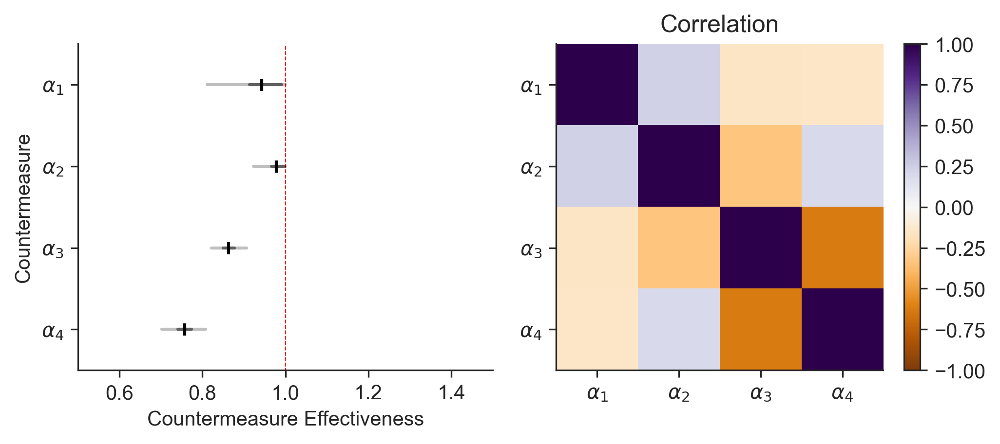

In [160]:
model.plot_effect()

INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/heldout_validation/out


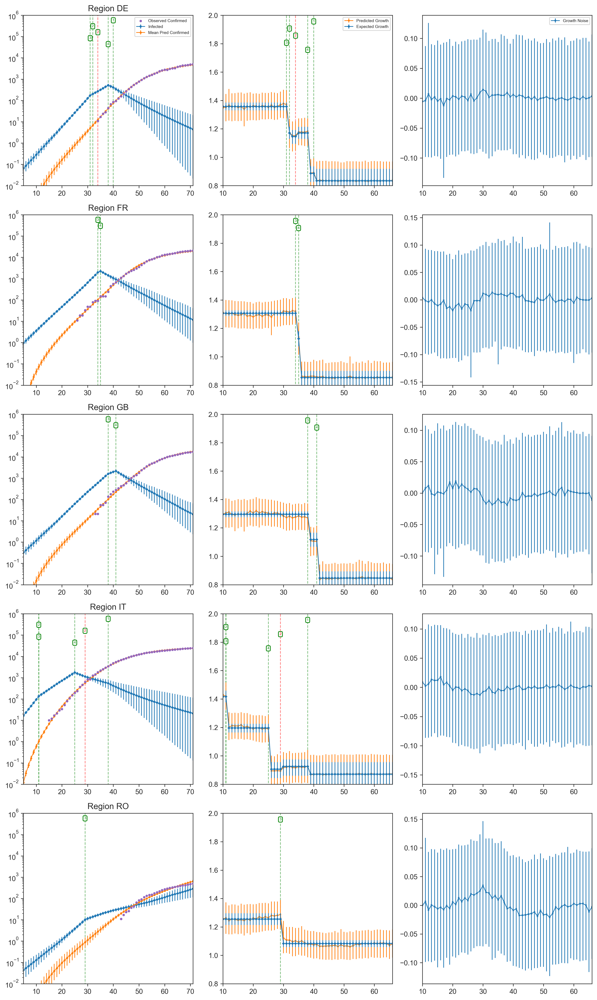

In [161]:
model.plot_region_predictions()